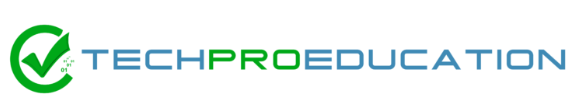

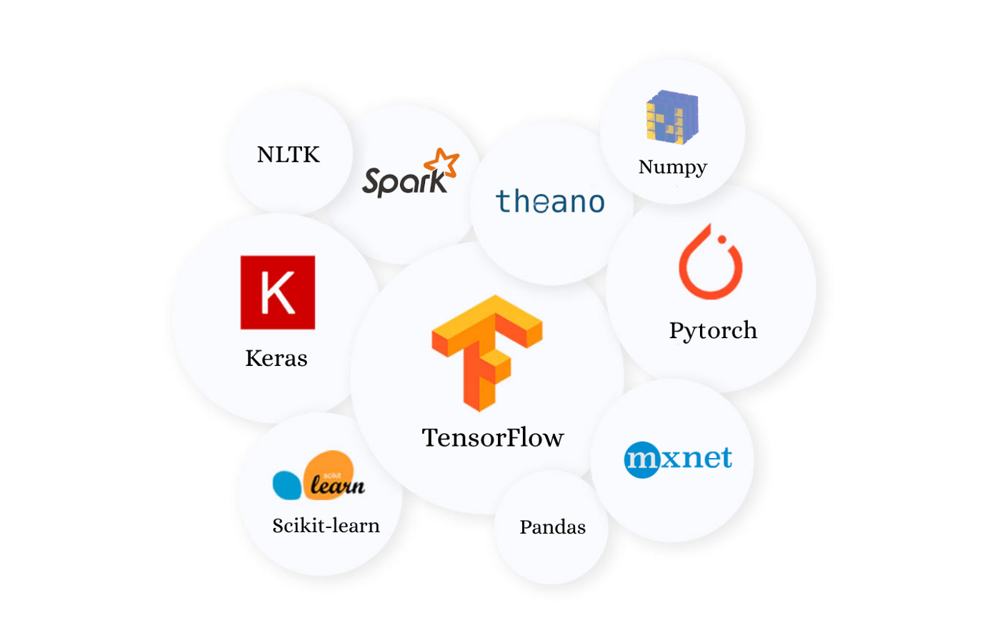

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [90]:
!pip install folium 

In [91]:
#from google.colab import drive
#drive.mount('/content/drive')

In [92]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

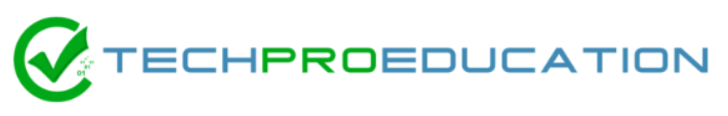

# House Sales in King County, USA

Predict house price using regression

This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

It's a great dataset for evaluating simple regression models.

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [93]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [94]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [96]:
df.isnull().sum().any()

False

In [97]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [98]:
df = df.drop('id', axis = 1)

### price

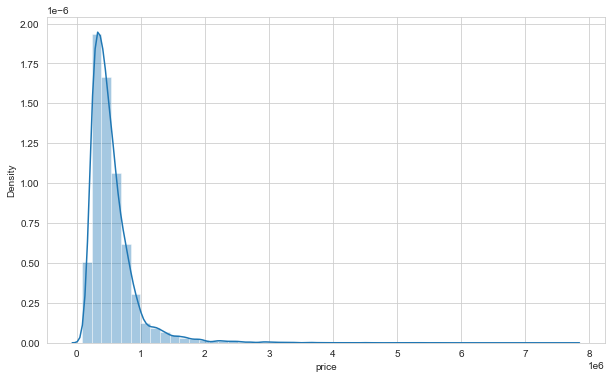

In [99]:
sns.distplot(df['price']);

In [100]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [101]:
df.groupby("waterfront").mean().T

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


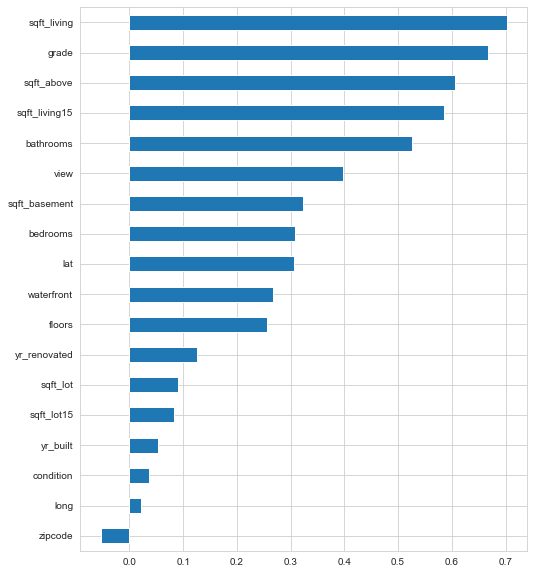

In [102]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

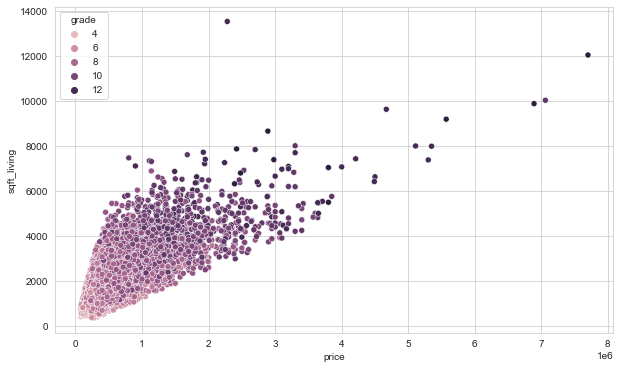

In [103]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

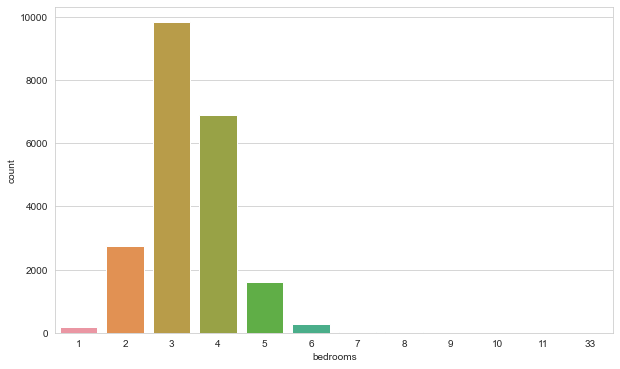

In [104]:
sns.countplot(df['bedrooms']);

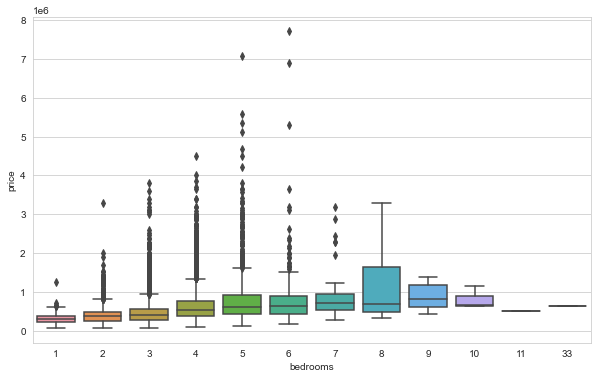

In [105]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [106]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [107]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [108]:
df.shape

(21596, 20)

### date

In [109]:
df['date'].dtype

dtype('O')

In [110]:
df['date'] = pd.to_datetime(df['date'])

In [111]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [112]:
df['year'] = df['date'].dt.year
#df['year'] = df['date'].apply(lambda date : date.year)

In [113]:
df['month'] = df['date'].dt.month

In [114]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


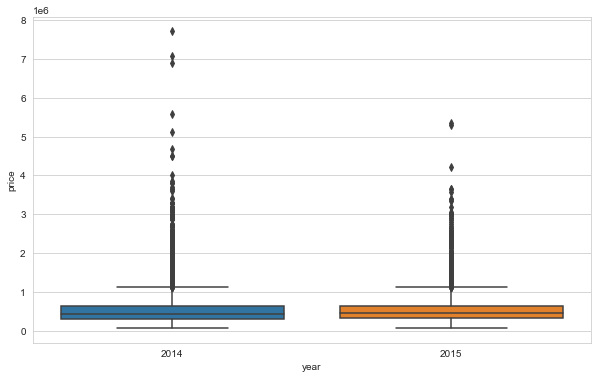

In [115]:
sns.boxplot(x = 'year', y = 'price', data = df);

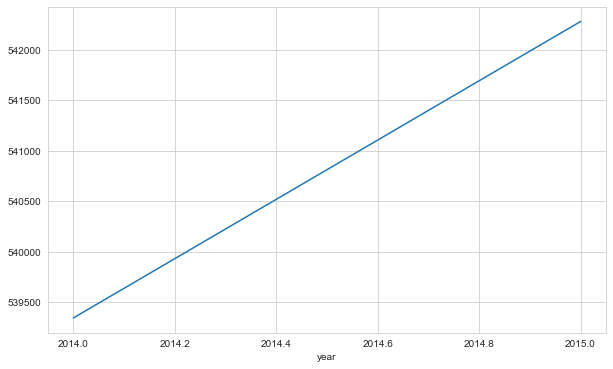

In [116]:
df.groupby('year')['price'].mean().plot();

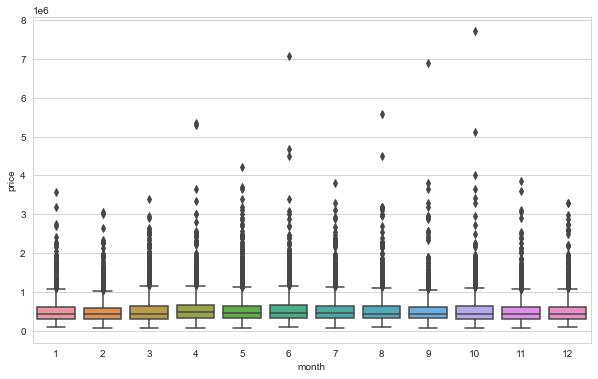

In [117]:
sns.boxplot(x = 'month', y = 'price', data = df);

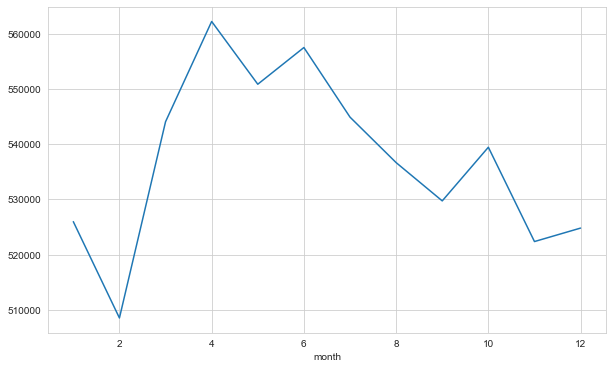

In [118]:
df.groupby('month')['price'].mean().plot();

In [119]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [120]:
df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [121]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [122]:
# pip install uszipcode

In [123]:
from uszipcode import SearchEngine, SimpleZipcode

search = SearchEngine()

df['zipcode'].apply(lambda x: search.by_zipcode(x).major_city)

0          Seattle
1          Seattle
2          Kenmore
3          Seattle
4        Sammamish
           ...    
21592      Seattle
21593      Seattle
21594      Seattle
21595     Issaquah
21596      Seattle
Name: zipcode, Length: 21596, dtype: object

In [124]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [125]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [126]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

### sqft_basement

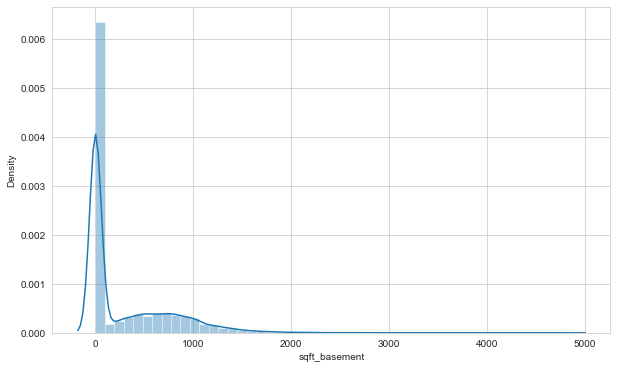

In [127]:
sns.distplot(df['sqft_basement']);

In [128]:
df['sqft_basement'].value_counts(dropna = False)

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [129]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


could make sense due to scaling, higher should correlate to more value

### sqft_above

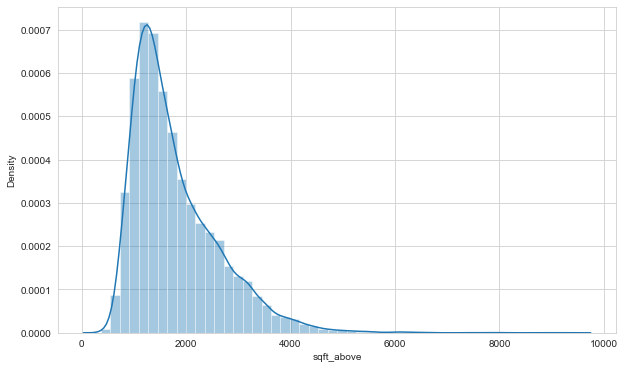

In [130]:
sns.distplot(df['sqft_above']);

In [131]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [132]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


### Geographical Properties

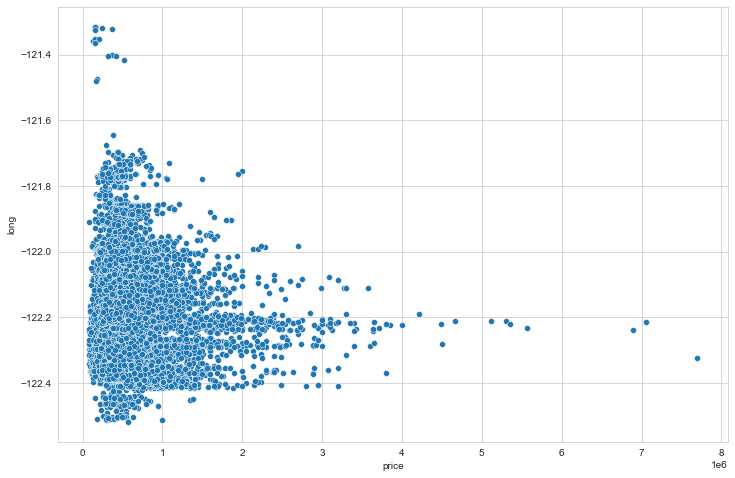

In [133]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

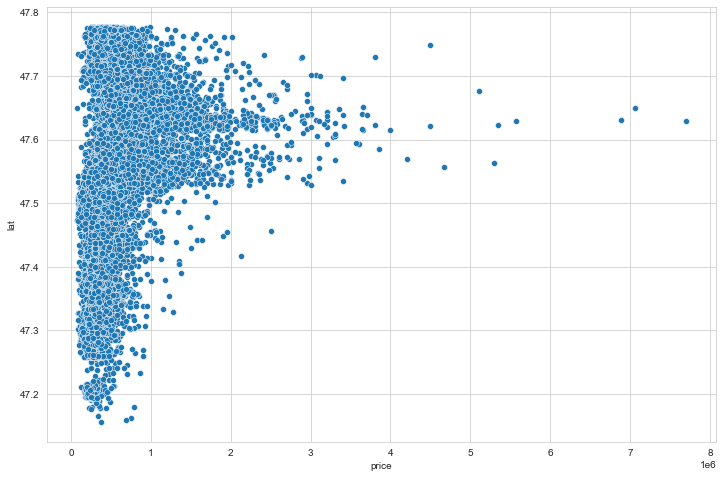

In [134]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

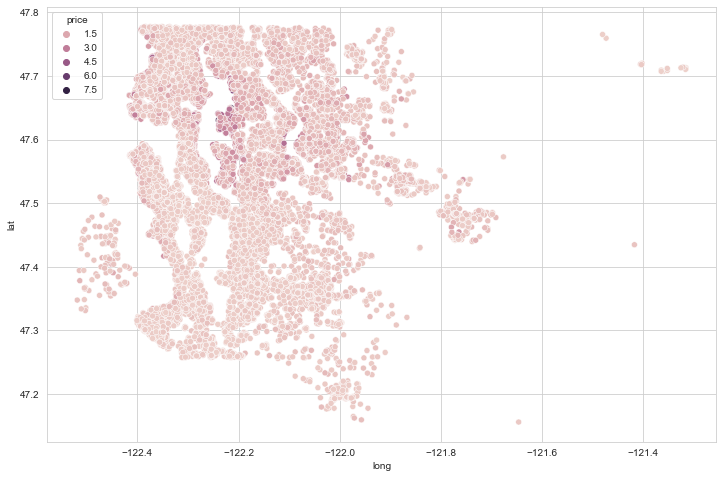

In [135]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [136]:
len(df) * (0.01)

215.96

In [137]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [138]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

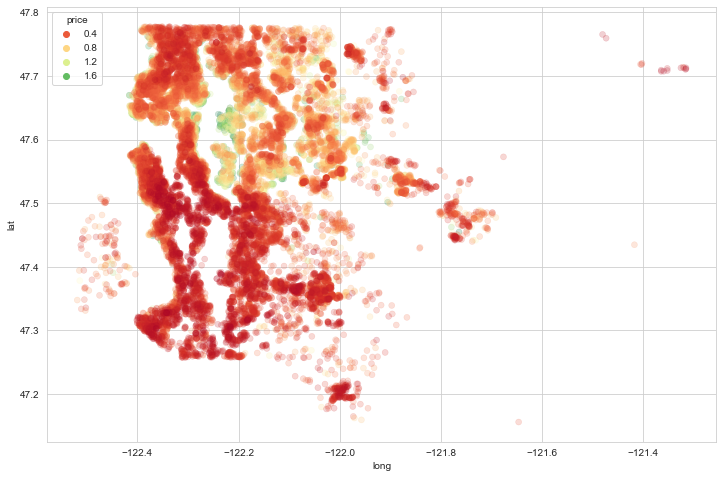

In [139]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

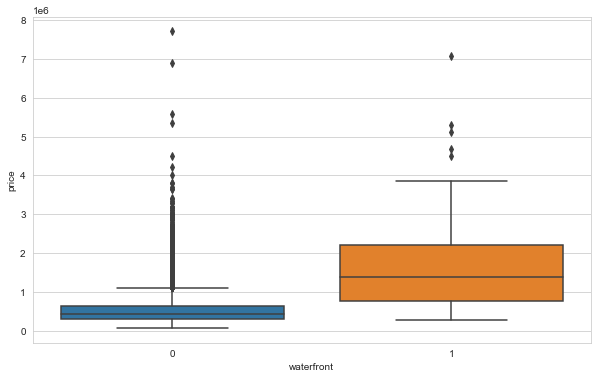

In [140]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [141]:
# pip install folium

* folium ile lattitude ve longitude değerleri girilerek harita gösterimi sağlanır 

In [142]:
import folium
import branca.colormap as cm

In [143]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [144]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [145]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)

colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)

for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1,                                               # yarıçap
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

### latest data

In [146]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [147]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [148]:
from sklearn.model_selection import train_test_split

In [149]:
X = df.drop('price', axis = 1)
y = df['price']

deep learning de büyük datasetlerde dataframe yerine array kullanmak gerekir. bunu da values ile yapıyorduk. burdaki datasetimiz küçük olduğu için dataframe ile devam ediyoruz. aşağıda values ile array yapma yöntemi

X = df.drop('price', axis = 1).values

y = df['price'].values

In [150]:
seed = 101

In [151]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [152]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [153]:
scaler = MinMaxScaler()

In [154]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

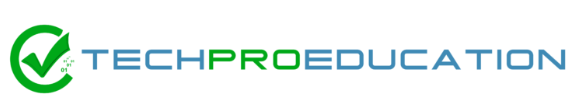

## Modelling & Model Performance

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [156]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [157]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [158]:
X_train.shape

(19436, 29)

In [159]:
tf.random.set_seed(seed)

model = Sequential()                                  # layer ların Sequential (ardışık) olacağı modele tanımlanıyor

model.add(Dense(29, activation = 'relu'))             # ilk layer da nöron sayısını feature sayısına eşit olarak belirledik 29
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(29, activation = 'relu'))             # ikinci layer da nöron sayısını 29 olarak verdik
model.add(Dense(15, activation = 'relu'))             # üçüncü layer da nöron sayısını 15 olarak verdik
model.add(Dense(8, activation = 'relu'))              # dördüncü layer da nöron sayısını 8 olarak verdik
model.add(Dense(1))                                   # regression problemlerinde output layer için 1 nöron tanımlıyoruz

model.compile(optimizer = 'adam', loss = 'mse')       # regression problemleri için cost function 'mse' dir

In [160]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 428575817728.0000 - val_loss: 423787593728.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 426004971520.0000 - val_loss: 415630360576.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 398086242304.0000 - val_loss: 357320359936.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 290371796992.0000 - val_loss: 206535426048.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 142260174848.0000 - val_loss: 109674676224.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 99249954816.0000 - val_loss: 104642576384.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 96625123328.0000 - val_loss: 103225057280.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 95004303360.0000 - val_loss: 101611642880.0000
Epoch 9/100

130/130 [==============================] - 0s 2ms/step - loss: 31899305984.0000 - val_loss: 35301195776.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 31925608448.0000 - val_loss: 35136397312.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 31826159616.0000 - val_loss: 35079024640.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31777345536.0000 - val_loss: 34958864384.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31769989120.0000 - val_loss: 34967384064.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31719542784.0000 - val_loss: 35062018048.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 31717265408.0000 - val_loss: 34871443456.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 31662290944.0000 - val_loss: 34824495104.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29734469632.0000 - val_loss: 32300130304.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29714530304.0000 - val_loss: 32281217024.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29734891520.0000 - val_loss: 32354336768.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 29717035008.0000 - val_loss: 32136826880.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 29684340736.0000 - val_loss: 32481017856.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 29715189760.0000 - val_loss: 32348891136.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 29662359552.0000 - val_loss: 32164220928.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 29671641088.0000 - val_loss: 32345726976.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 28431067136.0000 - val_loss: 30978062336.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 28447670272.0000 - val_loss: 30930567168.0000
Epoch 399/1000
130/130 [==============================] - 0s 3ms/step - loss: 28442730496.0000 - val_loss: 31129890816.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 28473346048.0000 - val_loss: 30827018240.0000
Epoch 401/1000
130/130 [==============================] - 0s 3ms/step - loss: 28404391936.0000 - val_loss: 30795268096.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 28405696512.0000 - val_loss: 30802798592.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 28360431616.0000 - val_loss: 31323127808.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 28382027776.0000 - val_loss: 30799849472.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26995402752.0000 - val_loss: 29711177728.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 26976376832.0000 - val_loss: 29799120896.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 26975006720.0000 - val_loss: 29570332672.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 26955755520.0000 - val_loss: 29781684224.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 26971881472.0000 - val_loss: 29693540352.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 26931824640.0000 - val_loss: 29627795456.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 26929078272.0000 - val_loss: 29671645184.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 26944215040.0000 - val_loss: 29514840064.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25765083136.0000 - val_loss: 28916123648.0000
Epoch 662/1000
130/130 [==============================] - 0s 3ms/step - loss: 25766621184.0000 - val_loss: 28908978176.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 25724784640.0000 - val_loss: 28762028032.0000
Epoch 664/1000
130/130 [==============================] - 0s 3ms/step - loss: 25735112704.0000 - val_loss: 28729397248.0000
Epoch 665/1000
130/130 [==============================] - 0s 3ms/step - loss: 25724067840.0000 - val_loss: 28983736320.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 25765951488.0000 - val_loss: 28788502528.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 25727854592.0000 - val_loss: 28743344128.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 25708652544.0000 - val_loss: 28852803584.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24829241344.0000 - val_loss: 28850171904.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 24798976000.0000 - val_loss: 28607107072.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 24817514496.0000 - val_loss: 28668585984.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 24821114880.0000 - val_loss: 28573710336.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 24783540224.0000 - val_loss: 28747268096.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 24795475968.0000 - val_loss: 28518486016.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 24822937600.0000 - val_loss: 28661305344.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 24783296512.0000 - val_loss: 28789463040.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24156102656.0000 - val_loss: 28680017920.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 24146726912.0000 - val_loss: 28816197632.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 24139460608.0000 - val_loss: 28893700096.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 24118898688.0000 - val_loss: 28952670208.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 24137099264.0000 - val_loss: 28931895296.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 24110639104.0000 - val_loss: 28986005504.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 24105869312.0000 - val_loss: 28770453504.0000
Epoch 932/1000
130/130 [==============================] - 0s 3ms/step - loss: 24102742016.0000 - val_loss: 28718618624.0000
Epoch 933/1000
130/130 

* validation_split ile train setimizin  0.15 lik kısmı validation/doğrulama için ayrılır. 
* epoch sırasında modelimiz batch_size ile belirtilen sayıda observation ile eğitilip backpropagation larla weights ve bais değrlerini güncelleyrek epoch sonunda loss değeri bulur. 
* modelimiz her epoch sonunda bulduğu weights ve bais değerleri ile validation_split ile ayırmış olduğumuz datamız ile test edilir ve val_loss bulunur. Yani her epoch sonunda kendi kendini test etmiş olur. Burda karıştırılmaması gereken validation_split ile ayrılan datamız train setten alınmıştır. Test setimizle alakası yoktur.
* model train setin 0.85 ini fit işlemi için, 0.15 lik kısmını ise her epoch sonunda validation için kullanır.

In [161]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 29)                870       
                                                                 
 dense_16 (Dense)            (None, 29)                870       
                                                                 
 dense_17 (Dense)            (None, 15)                450       
                                                                 
 dense_18 (Dense)            (None, 8)                 128       
                                                                 
 dense_19 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,327
Trainable params: 2,327
Non-trainable params: 0
_________________________________________________________________


In [162]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428575817728.000,423787593728.000
1,426004971520.000,415630360576.000
2,398086242304.000,357320359936.000
3,290371796992.000,206535426048.000
4,142260174848.000,109674676224.000
...,...,...
995,23862409216.000,28918714368.000
996,23844485120.000,29089675264.000
997,23840952320.000,29065646080.000
998,23813562368.000,29033787392.000


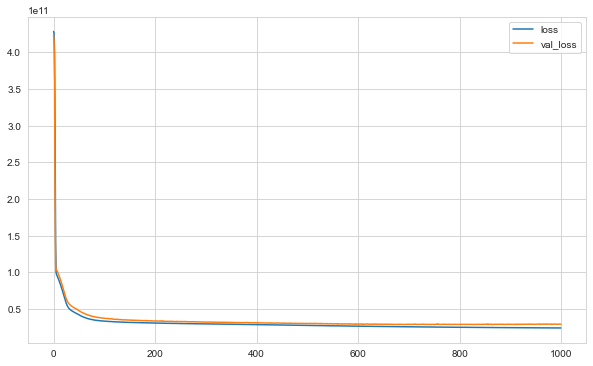

In [163]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [164]:
model.evaluate(X_test, y_test, verbose=0)      # Test setimiz ile prediction yapıp y_test ile karşılaştırıp mse score getirir

22348781568.0

In [165]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [166]:
eval_metric(y_test, y_pred)

r2_score: 0.8260520890568842 
mae: 92831.58444010417 
mse: 22348786187.43524 
rmse: 149495.1042256409


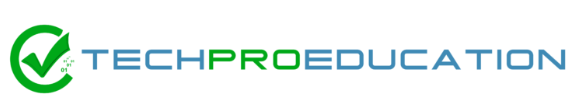

### learning_rate

Gradient Descent ile tepeden vadiye inerken adımlarımızın büyüklüğünü learning rate ile belirliyoruz. default değer 0.001 dir

In [167]:
from tensorflow.keras.optimizers import Adam

In [168]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)                              # default learning rate value is 0.001
model.compile(optimizer = opt, loss = 'mse')

In [169]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 424059699200.0000 - val_loss: 390626279424.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 208070590464.0000 - val_loss: 104664170496.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 94530895872.0000 - val_loss: 98992889856.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 88548655104.0000 - val_loss: 93108838400.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 82197979136.0000 - val_loss: 86515474432.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 75230846976.0000 - val_loss: 79068250112.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 67757072384.0000 - val_loss: 71572733952.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 60599713792.0000 - val_loss: 64740118528.0000
Epoch 9/1000
130/130

130/130 [==============================] - 0s 3ms/step - loss: 28272742400.0000 - val_loss: 30486509568.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 28267784192.0000 - val_loss: 30448771072.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 28172562432.0000 - val_loss: 30314373120.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 28147345408.0000 - val_loss: 30149562368.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 28079316992.0000 - val_loss: 30210056192.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 27991941120.0000 - val_loss: 31010994176.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 28106354688.0000 - val_loss: 30483449856.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 27949238272.0000 - val_loss: 30437027840.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25122074624.0000 - val_loss: 29118396416.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 25143271424.0000 - val_loss: 28870318080.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 25123074048.0000 - val_loss: 28803708928.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 25056464896.0000 - val_loss: 28741828608.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 25041829888.0000 - val_loss: 29757263872.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 25130416128.0000 - val_loss: 29023758336.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 25026881536.0000 - val_loss: 28819175424.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 25112612864.0000 - val_loss: 29176567808.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24127825920.0000 - val_loss: 30596118528.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 24170084352.0000 - val_loss: 29731315712.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 24187916288.0000 - val_loss: 30590871552.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 24261875712.0000 - val_loss: 30138290176.0000
Epoch 401/1000
130/130 [==============================] - 0s 3ms/step - loss: 24203735040.0000 - val_loss: 29583206400.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 24139186176.0000 - val_loss: 29677713408.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 24083959808.0000 - val_loss: 30402052096.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 24273252352.0000 - val_loss: 29645232128.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 23517665280.0000 - val_loss: 30151974912.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 23552100352.0000 - val_loss: 30751422464.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 23508578304.0000 - val_loss: 30382790656.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 23502651392.0000 - val_loss: 30725388288.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 23494488064.0000 - val_loss: 30211741696.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 23497633792.0000 - val_loss: 30365526016.0000
Epoch 535/1000
130/130 [==============================] - 0s 3ms/step - loss: 23503482880.0000 - val_loss: 30484256768.0000
Epoch 536/1000
130/130 [==============================] - 0s 3ms/step - loss: 23586131968.0000 - val_loss: 30487189504.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 18793353216.0000 - val_loss: 27558211584.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 18871445504.0000 - val_loss: 26509627392.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 18633238528.0000 - val_loss: 26577514496.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 18523684864.0000 - val_loss: 26045540352.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 18656276480.0000 - val_loss: 26470965248.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 18526588928.0000 - val_loss: 26108178432.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 18420676608.0000 - val_loss: 26181455872.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 18311567360.0000 - val_loss: 26497466368.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 15504917504.0000 - val_loss: 24046962688.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 15497251840.0000 - val_loss: 23486787584.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 15487141888.0000 - val_loss: 23578335232.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 15456750592.0000 - val_loss: 23688093696.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 15501155328.0000 - val_loss: 23605702656.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 15530070016.0000 - val_loss: 24457349120.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 15460520960.0000 - val_loss: 23424110592.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 15427726336.0000 - val_loss: 23423297536.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 14045600768.0000 - val_loss: 22434181120.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 14132293632.0000 - val_loss: 22965952512.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 14178896896.0000 - val_loss: 22982569984.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 14036473856.0000 - val_loss: 23137470464.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 14070813696.0000 - val_loss: 22913572864.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 14087914496.0000 - val_loss: 23210807296.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 14036149248.0000 - val_loss: 22544347136.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 14022158336.0000 - val_loss: 23868246016.0000
Epoch 933/1000
130/130 

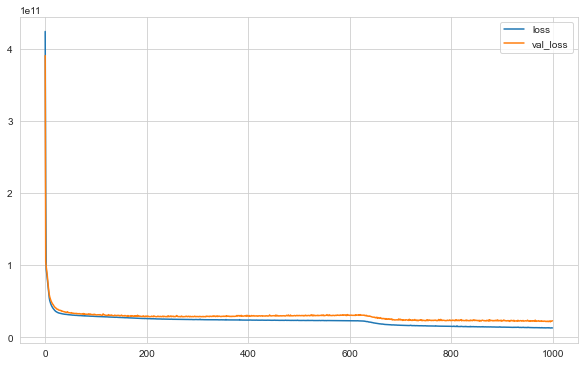

In [170]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

yaklaşık olarak 200 epoch tan sonra loss ile val_loss arasındaki farkın açıldığını görebiliyoruz. bu açıklık arttıkça overfit durumu ortaya çıkar. 1000 epoch gereksiz, eğitim amacıyla yapıyoruz. zaten aşağıda early stopping ile bunu engelleyeceğiz.

In [171]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [172]:
eval_metric(y_test, y_pred)

r2_score: 0.8774753484503373 
mae: 77133.46627604167 
mse: 15741938062.532335 
rmse: 125466.88034111765


### EarlyStopping

model eğitimi sırasında takip ettiğimiz score değerinde iyileşme olmadığında eğitimi durdurur. eğitim için girilen epoch sayısını tamamlamaya çalışmaz bu durumda.
* monitor: default değer 'val_loss' dur. model başarısı için takip edilecek score değerini belirtir.
* mode: default değer 'auto' dur. {"auto", "min", "max"} olarak tanımlanabilir. 
    * 'min' için monitor parametresi ile tanımlanan score değerinin minimum olmasını dikkate alır,
    * "max" için monitor parametresi ile tanımlanan score değerinin maximum olmasını dikkate alır,
    * "auto" için monitor parametresi ile tanımlanan score değerinin adına bakarak otomatik olarak  max yada min olmasını dikkate alır
* patience : default değer 0 ' dır. monitor parametresi ile tanımlanan score değerindeki iyileşmeyi takip eder ve belirtilen sayı kadar epoch sonunda iyileşme olmazsa eğitimi durdurur.

early stopping büyük datasetlerinde tercih edilmeyebilir. early stopping yaptıktan sonrada eğitim devam edebilir. aşağıdaki örnekte patience = 25 yaptıktan sonra eğitim duruyor ama eğitim devam ettiğinde score da iyileşme olma ihtimali de vardır. aşağıda r2 score değerine bakarsak düştüğünü görmüş oluruz.

In [3]:
from tensorflow.keras.callbacks import EarlyStopping

In [173]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [174]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25) 

In [175]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 425242198016.0000 - val_loss: 398322925568.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 222190649344.0000 - val_loss: 105050587136.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 94956617728.0000 - val_loss: 99479592960.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 89211355136.0000 - val_loss: 93844963328.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 83148283904.0000 - val_loss: 87583760384.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 76533219328.0000 - val_loss: 80527900672.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 69397684224.0000 - val_loss: 73339510784.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 62322511872.0000 - val_loss: 66396561408.0000
Epoch 9/1000
130/130

130/130 [==============================] - 0s 2ms/step - loss: 28456413184.0000 - val_loss: 30856634368.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 28456583168.0000 - val_loss: 30824581120.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 28352983040.0000 - val_loss: 30729232384.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 28302938112.0000 - val_loss: 30571579392.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 28243683328.0000 - val_loss: 30635245568.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 28167485440.0000 - val_loss: 31283357696.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 28262178816.0000 - val_loss: 30881507328.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 28103426048.0000 - val_loss: 30875926528.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25222449152.0000 - val_loss: 29576751104.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 25205155840.0000 - val_loss: 29441132544.0000
Epoch 266: early stopping


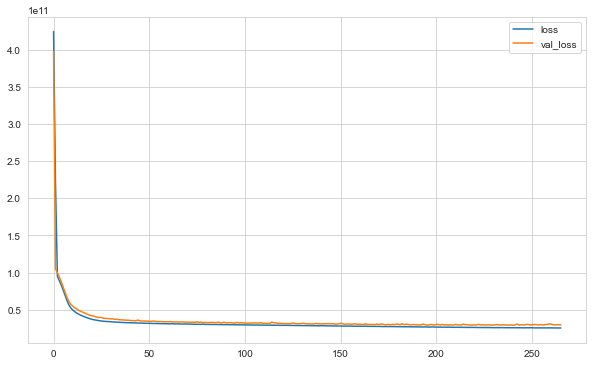

In [176]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [177]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [178]:
eval_metric(y_test, y_pred)

r2_score: 0.8212250101246501 
mae: 95095.95647424768 
mse: 22968968139.500492 
rmse: 151555.1653342785


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Overfit i önlemek için nöronların bir kısmını söndürmeyi sağlar. her layer da hangi oranda nöron söndürüleceği aşağıda olduğu gibi tanımlanır. her layer da nöronların istediğimiz orandaki kısmını random olarak söndürür. büyük datasetlerde etkilidir, küçük datasetlerde faydalı olmayabilir. Aşağıda bunu görüyoruz. r2 score değerimiz düştü.

In [179]:
from tensorflow.keras.layers import Dropout

In [180]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(15, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(8, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [181]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [182]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 2s 5ms/step - loss: 423937769472.0000 - val_loss: 386041380864.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 205757530112.0000 - val_loss: 106780663808.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 122193747968.0000 - val_loss: 99515219968.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 111050555392.0000 - val_loss: 91898380288.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 107110072320.0000 - val_loss: 85157650432.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 99454943232.0000 - val_loss: 78338809856.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 92499156992.0000 - val_loss: 69364301824.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 85616304128.0000 - val_loss: 64129003520.0000
Epoch 9/1000
130/

130/130 [==============================] - 0s 3ms/step - loss: 54521237504.0000 - val_loss: 33369710592.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 54779650048.0000 - val_loss: 32627257344.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 54872801280.0000 - val_loss: 32293042176.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 59523194880.0000 - val_loss: 33354862592.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 54299709440.0000 - val_loss: 33273065472.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 56466386944.0000 - val_loss: 31835279360.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 54331445248.0000 - val_loss: 32422455296.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 55581790208.0000 - val_loss: 34086367232.0000
Epoch 141/1000
130/130 

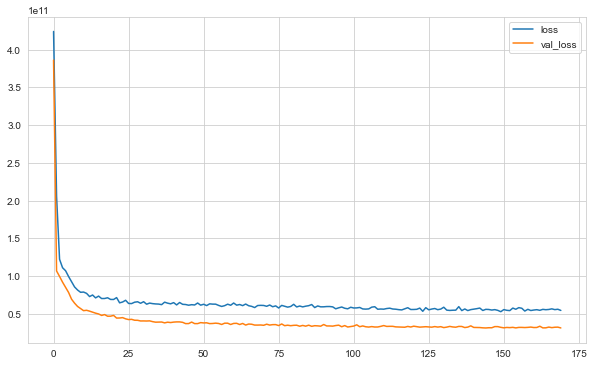

In [183]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [184]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [185]:
eval_metric(y_test, y_pred)

r2_score: 0.797325854385888 
mae: 99835.03544560185 
mse: 26039525979.315407 
rmse: 161367.67327849593


## Saving Final Model and Scaler

Final model için yukarda en iyi score aldığımız parametreleri kullanıyoruz.

In [186]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [187]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [ ]:
# early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [188]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000,
          # callbacks = [early_stop]
         )

# validation_split yerine validation_data parametresini kullandık ve Test setimizi buraya verdik.

Epoch 1/1000
152/152 [==============================] - 1s 4ms/step - loss: 422789120000.0000 - val_loss: 380367372288.0000
Epoch 2/1000
152/152 [==============================] - 0s 2ms/step - loss: 195912056832.0000 - val_loss: 91541299200.0000
Epoch 3/1000
152/152 [==============================] - 0s 2ms/step - loss: 95065546752.0000 - val_loss: 85760229376.0000
Epoch 4/1000
152/152 [==============================] - 0s 3ms/step - loss: 89240993792.0000 - val_loss: 79888547840.0000
Epoch 5/1000
152/152 [==============================] - 0s 3ms/step - loss: 82975686656.0000 - val_loss: 73323765760.0000
Epoch 6/1000
152/152 [==============================] - 0s 2ms/step - loss: 76133310464.0000 - val_loss: 66333229056.0000
Epoch 7/1000
152/152 [==============================] - 0s 2ms/step - loss: 68658520064.0000 - val_loss: 58903392256.0000
Epoch 8/1000
152/152 [==============================] - 0s 2ms/step - loss: 61320167424.0000 - val_loss: 52579860480.0000
Epoch 9/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 27567073280.0000 - val_loss: 23860109312.0000
Epoch 134/1000
152/152 [==============================] - 0s 2ms/step - loss: 27431184384.0000 - val_loss: 24044736512.0000
Epoch 135/1000
152/152 [==============================] - 0s 2ms/step - loss: 27435712512.0000 - val_loss: 23885950976.0000
Epoch 136/1000
152/152 [==============================] - 0s 2ms/step - loss: 27292233728.0000 - val_loss: 24288899072.0000
Epoch 137/1000
152/152 [==============================] - 0s 3ms/step - loss: 27400357888.0000 - val_loss: 23811938304.0000
Epoch 138/1000
152/152 [==============================] - 0s 2ms/step - loss: 27301484544.0000 - val_loss: 23744081920.0000
Epoch 139/1000
152/152 [==============================] - 0s 2ms/step - loss: 27147091968.0000 - val_loss: 23684667392.0000
Epoch 140/1000
152/152 [==============================] - 0s 2ms/step - loss: 27185313792.0000 - val_loss: 23579592704.0000
Epoch 141/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 18097244160.0000 - val_loss: 16587705344.0000
Epoch 266/1000
152/152 [==============================] - 0s 2ms/step - loss: 18049228800.0000 - val_loss: 16904122368.0000
Epoch 267/1000
152/152 [==============================] - 0s 2ms/step - loss: 18096078848.0000 - val_loss: 17240121344.0000
Epoch 268/1000
152/152 [==============================] - 0s 2ms/step - loss: 18078781440.0000 - val_loss: 17060521984.0000
Epoch 269/1000
152/152 [==============================] - 0s 2ms/step - loss: 18029256704.0000 - val_loss: 16911515648.0000
Epoch 270/1000
152/152 [==============================] - 0s 2ms/step - loss: 17848094720.0000 - val_loss: 16679455744.0000
Epoch 271/1000
152/152 [==============================] - 0s 2ms/step - loss: 17834868736.0000 - val_loss: 16727317504.0000
Epoch 272/1000
152/152 [==============================] - 0s 2ms/step - loss: 17740306432.0000 - val_loss: 16754524160.0000
Epoch 273/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 14574930944.0000 - val_loss: 15384292352.0000
Epoch 398/1000
152/152 [==============================] - 0s 2ms/step - loss: 14435944448.0000 - val_loss: 15616150528.0000
Epoch 399/1000
152/152 [==============================] - 0s 2ms/step - loss: 14570518528.0000 - val_loss: 15301348352.0000
Epoch 400/1000
152/152 [==============================] - 0s 2ms/step - loss: 14525900800.0000 - val_loss: 15354677248.0000
Epoch 401/1000
152/152 [==============================] - 0s 2ms/step - loss: 14512327680.0000 - val_loss: 15411988480.0000
Epoch 402/1000
152/152 [==============================] - 0s 3ms/step - loss: 14525699072.0000 - val_loss: 15561956352.0000
Epoch 403/1000
152/152 [==============================] - 0s 2ms/step - loss: 14496056320.0000 - val_loss: 15540984832.0000
Epoch 404/1000
152/152 [==============================] - 0s 2ms/step - loss: 14419588096.0000 - val_loss: 15682136064.0000
Epoch 405/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12877756416.0000 - val_loss: 14776253440.0000
Epoch 530/1000
152/152 [==============================] - 0s 2ms/step - loss: 12926854144.0000 - val_loss: 14445039616.0000
Epoch 531/1000
152/152 [==============================] - 0s 3ms/step - loss: 12947086336.0000 - val_loss: 14659092480.0000
Epoch 532/1000
152/152 [==============================] - 0s 3ms/step - loss: 12903248896.0000 - val_loss: 14490882048.0000
Epoch 533/1000
152/152 [==============================] - 0s 3ms/step - loss: 12944968704.0000 - val_loss: 15064636416.0000
Epoch 534/1000
152/152 [==============================] - 0s 3ms/step - loss: 12861234176.0000 - val_loss: 14568357888.0000
Epoch 535/1000
152/152 [==============================] - 0s 3ms/step - loss: 12765556736.0000 - val_loss: 14871456768.0000
Epoch 536/1000
152/152 [==============================] - 0s 3ms/step - loss: 12939797504.0000 - val_loss: 14475694080.0000
Epoch 537/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 11254495232.0000 - val_loss: 14509266944.0000
Epoch 662/1000
152/152 [==============================] - 0s 3ms/step - loss: 11227374592.0000 - val_loss: 14081197056.0000
Epoch 663/1000
152/152 [==============================] - 0s 2ms/step - loss: 11202210816.0000 - val_loss: 14017752064.0000
Epoch 664/1000
152/152 [==============================] - 0s 2ms/step - loss: 11326407680.0000 - val_loss: 14485805056.0000
Epoch 665/1000
152/152 [==============================] - 0s 2ms/step - loss: 11244914688.0000 - val_loss: 14038864896.0000
Epoch 666/1000
152/152 [==============================] - 0s 2ms/step - loss: 11215180800.0000 - val_loss: 14107216896.0000
Epoch 667/1000
152/152 [==============================] - 0s 2ms/step - loss: 11145961472.0000 - val_loss: 14252346368.0000
Epoch 668/1000
152/152 [==============================] - 0s 2ms/step - loss: 11313156096.0000 - val_loss: 14183519232.0000
Epoch 669/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 10494141440.0000 - val_loss: 13824476160.0000
Epoch 794/1000
152/152 [==============================] - 0s 2ms/step - loss: 10493589504.0000 - val_loss: 13784925184.0000
Epoch 795/1000
152/152 [==============================] - 0s 2ms/step - loss: 10485120000.0000 - val_loss: 13884198912.0000
Epoch 796/1000
152/152 [==============================] - 0s 2ms/step - loss: 10601326592.0000 - val_loss: 13927627776.0000
Epoch 797/1000
152/152 [==============================] - 0s 2ms/step - loss: 10568799232.0000 - val_loss: 14053548032.0000
Epoch 798/1000
152/152 [==============================] - 0s 2ms/step - loss: 10516583424.0000 - val_loss: 14062627840.0000
Epoch 799/1000
152/152 [==============================] - 0s 2ms/step - loss: 10518750208.0000 - val_loss: 13872831488.0000
Epoch 800/1000
152/152 [==============================] - 0s 2ms/step - loss: 10446254080.0000 - val_loss: 14019897344.0000
Epoch 801/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 9922112512.0000 - val_loss: 13876488192.0000
Epoch 926/1000
152/152 [==============================] - 0s 3ms/step - loss: 9919219712.0000 - val_loss: 13853200384.0000
Epoch 927/1000
152/152 [==============================] - 0s 2ms/step - loss: 9891099648.0000 - val_loss: 13711493120.0000
Epoch 928/1000
152/152 [==============================] - 0s 2ms/step - loss: 9955664896.0000 - val_loss: 13786729472.0000
Epoch 929/1000
152/152 [==============================] - 0s 3ms/step - loss: 10115522560.0000 - val_loss: 13407769600.0000
Epoch 930/1000
152/152 [==============================] - 0s 2ms/step - loss: 9981813760.0000 - val_loss: 13683706880.0000
Epoch 931/1000
152/152 [==============================] - 0s 3ms/step - loss: 9876227072.0000 - val_loss: 13821510656.0000
Epoch 932/1000
152/152 [==============================] - 0s 2ms/step - loss: 9958561792.0000 - val_loss: 14092603392.0000
Epoch 933/1000
152/152 [======

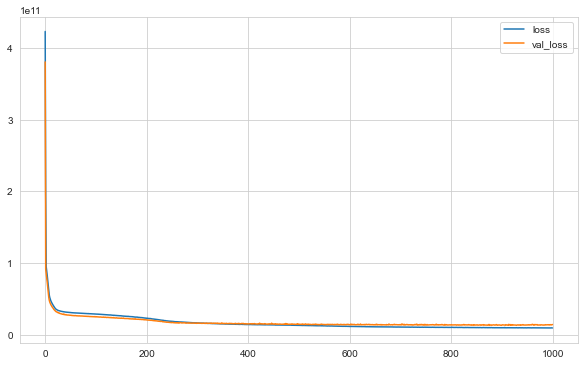

In [189]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [190]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [191]:
eval_metric(y_test, y_pred)

r2_score: 0.8866941126154235 
mae: 69466.8521556713 
mse: 14557513437.24737 
rmse: 120654.52099796082


In [192]:
model.save('model_kc_house.h5')  # creates a D5 file 'my_model.h5'

## Loading Model and Scaler

In [193]:
from tensorflow.keras.models import load_model

In [194]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [195]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]     # datasetimizdeki ilk observation ı prediction için kullanıyoruz
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [196]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [197]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 73ms/step


array([[232580.95]], dtype=float32)

In [198]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression 

In [199]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

<IPython.core.display.Javascript object>

r2_score: 0.7132632085213255 
mae: 122895.05648148149 
mse: 36839874707.80093 
rmse: 191937.1634358519


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [200]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

<IPython.core.display.Javascript object>

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479


burada DL ile final modelde aldığımız r2 score değerimiz RF ile aldığımız score ile yakın değerde çıktı. büyük datasetlerde bu durum pek görülmez. ML yöntemleri büyük datasetlerde iyi sonuç vermez. burada datasetimiz küçük olduğu için RF ile iyi score aldık. 

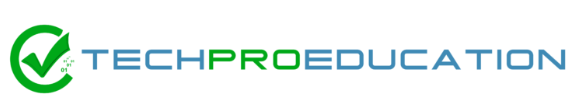